In [43]:
import torch
import torchvision
from torchvision import transforms

import numpy as np 
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import h5py

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## load the trained model

In [2]:
from Architecture.UNet_norm import UNet

model= UNet(in_channels=3, out_channels=31).to(device).float()


model.load_state_dict(torch.load('../Models/best_UNet_norm_retrain.pth', map_location=device))
model.eval() 

UNet(
  (enc1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (spacial_enc1): SpatialAttention(
    (conv1): Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))
    (sigmoid): Sigmoid()
    (batch_norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (spectral_enc1): SpectralAttention(
    (conv1): Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))
    (sigmoid): Sigmoid()
  )
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (spa

# Please provide the image path below for any regular rgb image! or use the image from the testing_data

## The model with take the 3 channel rgb image and reconstruct it to 31 channel HyperSpectral Image

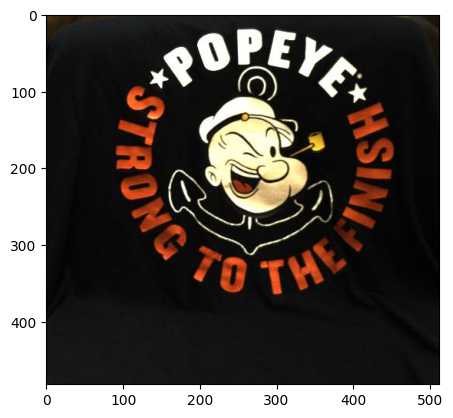

In [30]:
# image_path = 'path/to/your/image.jpg'
image_path = './testing_data/Valid_RGB/ARAD_1K_0929.jpg'
image = Image.open(image_path)
plt.imshow(image)

In [31]:
image.size

(512, 482)

In [32]:
import torch
import torchvision.transforms as transforms
from PIL import Image

# Load your image (replace 'path_to_your_image' with the actual file path)

# Define transformations to convert and preprocess the image
preprocess = transforms.Compose([
    transforms.Resize((512, 512)),  # Resize the image to match your model's input size
    transforms.ToTensor(),  # Convert the image to a PyTorch tensor
    transforms.Lambda(lambda x: x[:3, :, :])  # Ensure only the first three channels are used
])

# Apply the transformations to the image
input_data = preprocess(image)

# Add an extra dimension to match the batch size (1 image in this case)
input_data = input_data.unsqueeze(0)

# Assuming 'device' is defined (e.g., device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu"))
# and 'model' is your pre-loaded model
input_data = input_data.to(device)

with torch.no_grad():
    output = model(input_data)

print('input data max:', input_data.max())
print('input data min:', input_data.min())
print('output shape:', output.shape)
print('output max:', output.max())
print('output min:', output.min())


input data max: tensor(1., device='cuda:0')
input data min: tensor(0., device='cuda:0')
output shape: torch.Size([1, 31, 512, 512])
output max: tensor(1., device='cuda:0')
output min: tensor(0., device='cuda:0')


In [33]:
output

tensor([[[[0.0177, 0.0183, 0.0173,  ..., 0.0102, 0.0101, 0.0098],
          [0.0157, 0.0167, 0.0156,  ..., 0.0103, 0.0098, 0.0060],
          [0.0134, 0.0130, 0.0130,  ..., 0.0100, 0.0092, 0.0091],
          ...,
          [0.0207, 0.0212, 0.0206,  ..., 0.0128, 0.0119, 0.0080],
          [0.0192, 0.0192, 0.0188,  ..., 0.0110, 0.0092, 0.0086],
          [0.0184, 0.0185, 0.0182,  ..., 0.0109, 0.0088, 0.0000]],

         [[0.0196, 0.0207, 0.0191,  ..., 0.0110, 0.0116, 0.0112],
          [0.0169, 0.0180, 0.0169,  ..., 0.0112, 0.0113, 0.0109],
          [0.0154, 0.0149, 0.0149,  ..., 0.0106, 0.0101, 0.0099],
          ...,
          [0.0254, 0.0260, 0.0255,  ..., 0.0151, 0.0142, 0.0140],
          [0.0237, 0.0236, 0.0245,  ..., 0.0133, 0.0122, 0.0113],
          [0.0225, 0.0224, 0.0237,  ..., 0.0133, 0.0116, 0.0107]],

         [[0.0215, 0.0228, 0.0211,  ..., 0.0114, 0.0126, 0.0121],
          [0.0181, 0.0196, 0.0185,  ..., 0.0116, 0.0121, 0.0116],
          [0.0176, 0.0172, 0.0169,  ..., 0

## visualizing the output

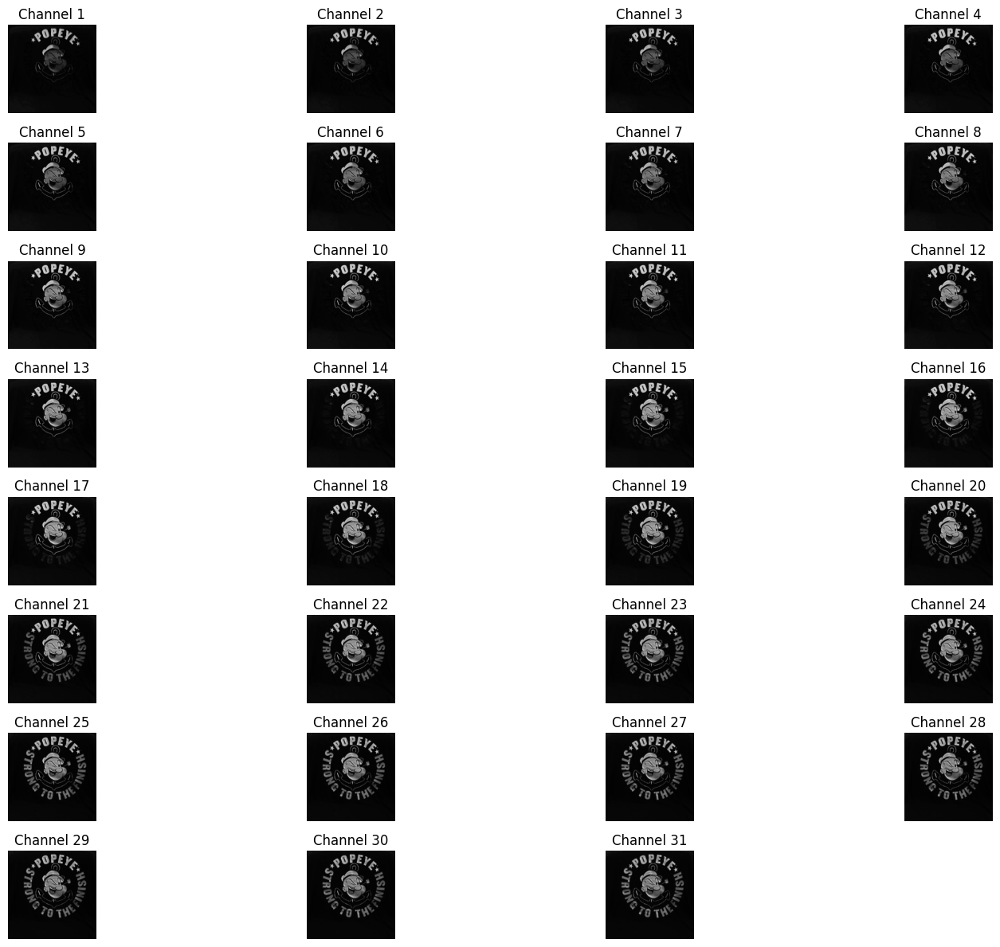

In [34]:
import matplotlib.pyplot as plt

# Assuming 'output' is the result from your model and has shape [1, 31, 482, 512]
# Remove the batch dimension if it exists
if len(output.shape) > 3:
    output = output.squeeze(0)

num_channels = output.shape[0]
num_rows = 8  # You can adjust this based on your preference
num_cols = (num_channels + num_rows - 1) // num_rows  # Calculate the number of columns

plt.figure(figsize=(16, 12))  # Adjust the figure size as needed

for i in range(num_channels):
    plt.subplot(num_rows, num_cols, i + 1)
    channel_data = output[i].cpu().numpy()  # Convert the channel data to a NumPy array
    plt.imshow(channel_data, cmap='gray')  # Display the image in grayscale
    plt.title(f'Channel {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


## bigger visulaization of all 31 channels.

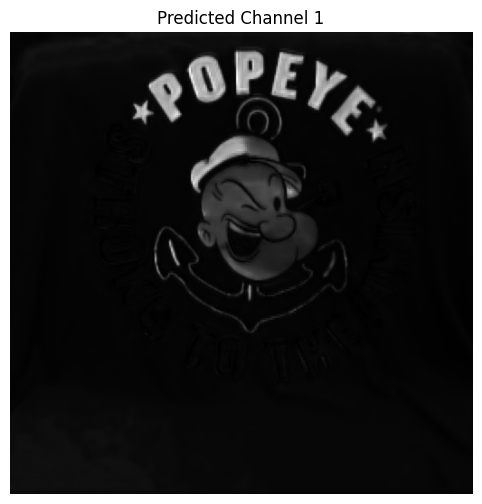

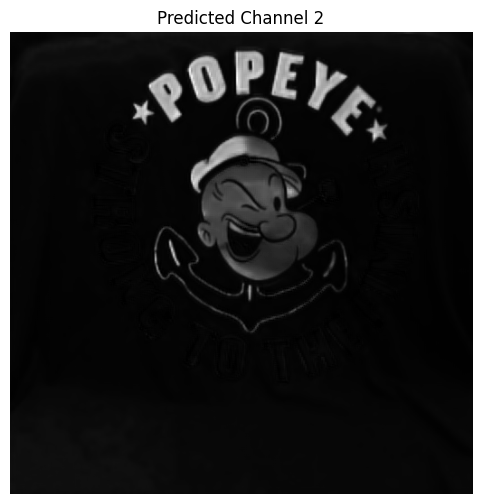

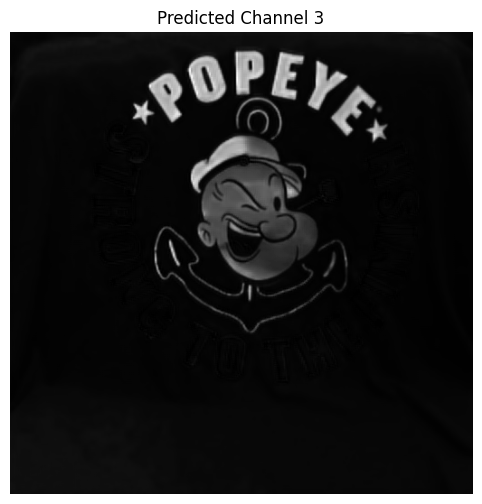

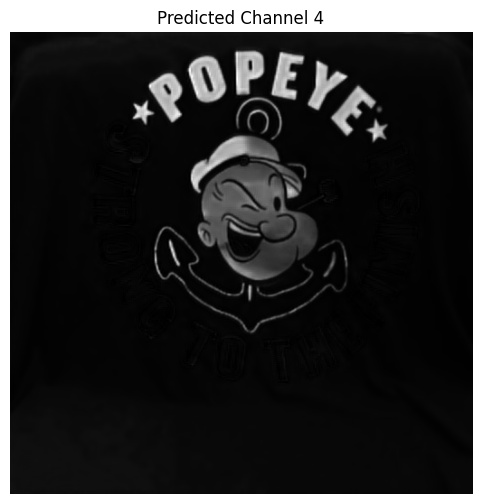

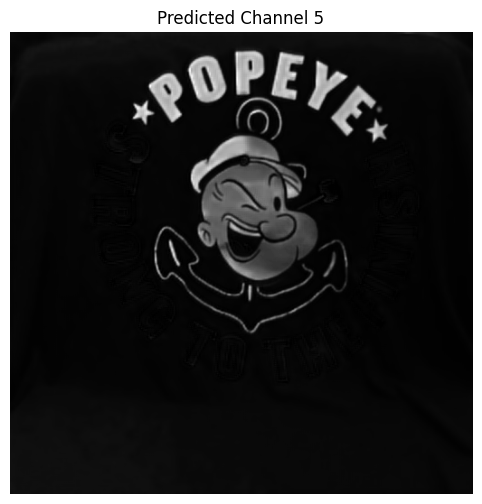

...

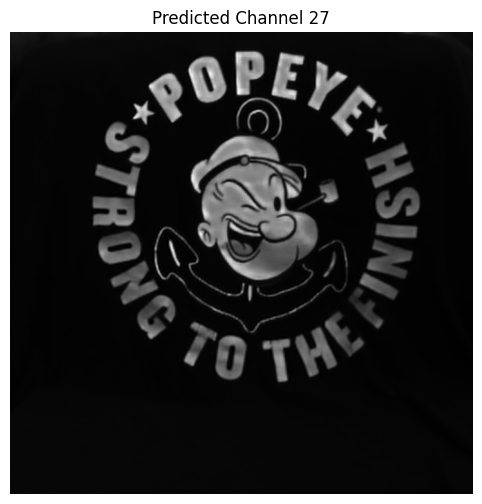

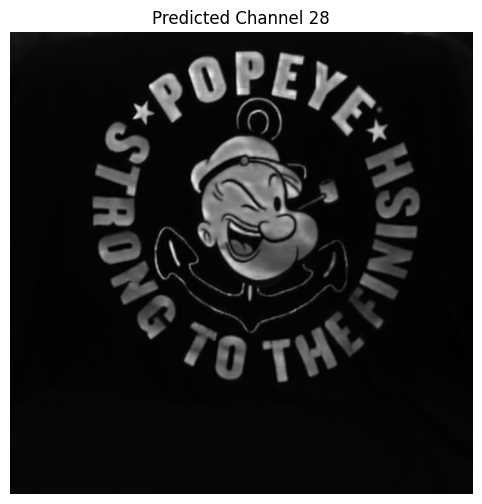

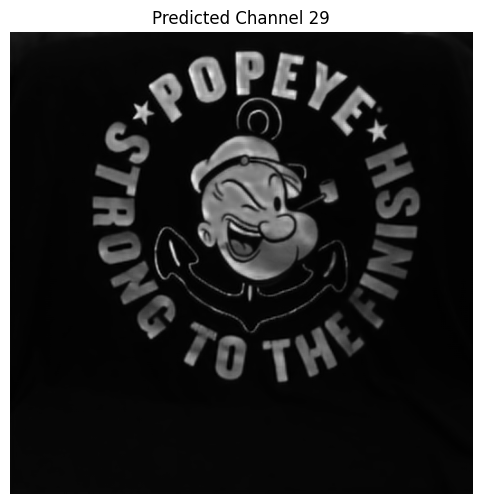

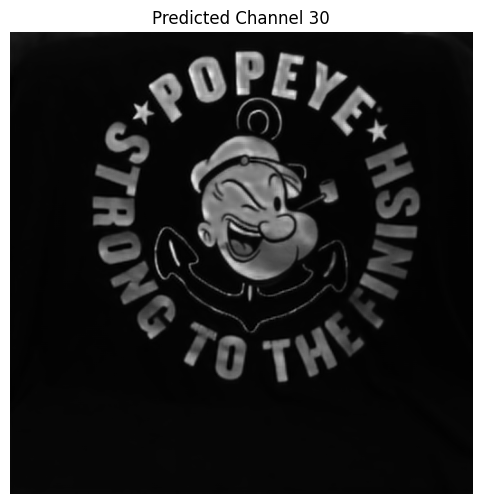

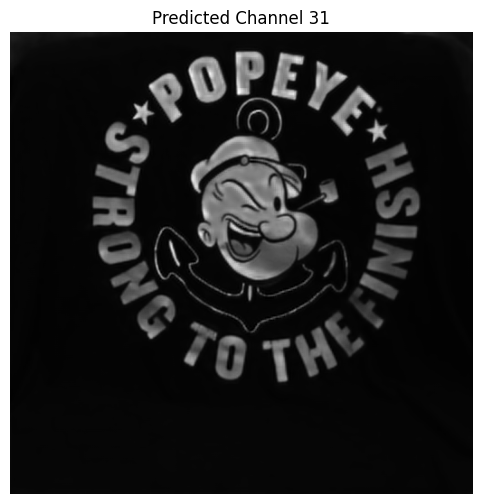

In [35]:
import matplotlib.pyplot as plt

# Remove the batch dimension if it exists in the output tensor
if len(output.shape) > 3:
    output = output.squeeze(0)

num_channels = output.shape[0]

# Loop through each channel and create subplots for predicted and ground truth
for i in range(num_channels):
    plt.figure(figsize=(16, 6))  # Adjust the figure size as needed

    # Display predicted image
    plt.subplot(1, 1, 1)  # 1 row, 2 columns, first subplot
    channel_data_pred = output[i].cpu().numpy()  # Convert to NumPy array
    plt.imshow(channel_data_pred, cmap='gray')  # Display in grayscale
    plt.title(f'Predicted Channel {i + 1}')
    plt.axis('off')
    plt.show()


## Testing the model on rgb data and comparing with ground truth, to see the quality of reconstruction

### loading and visulazing input and Ground Truth

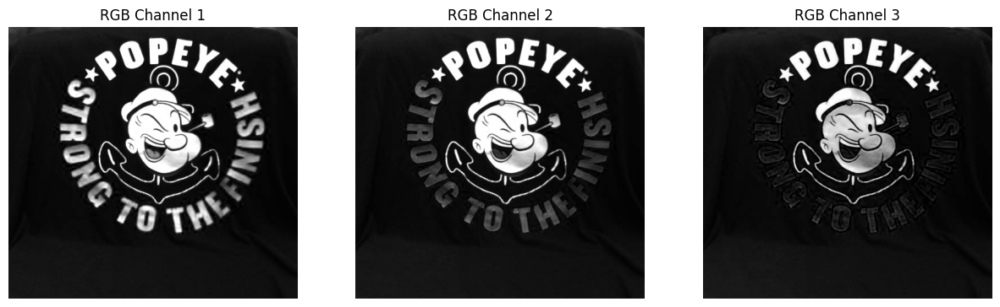

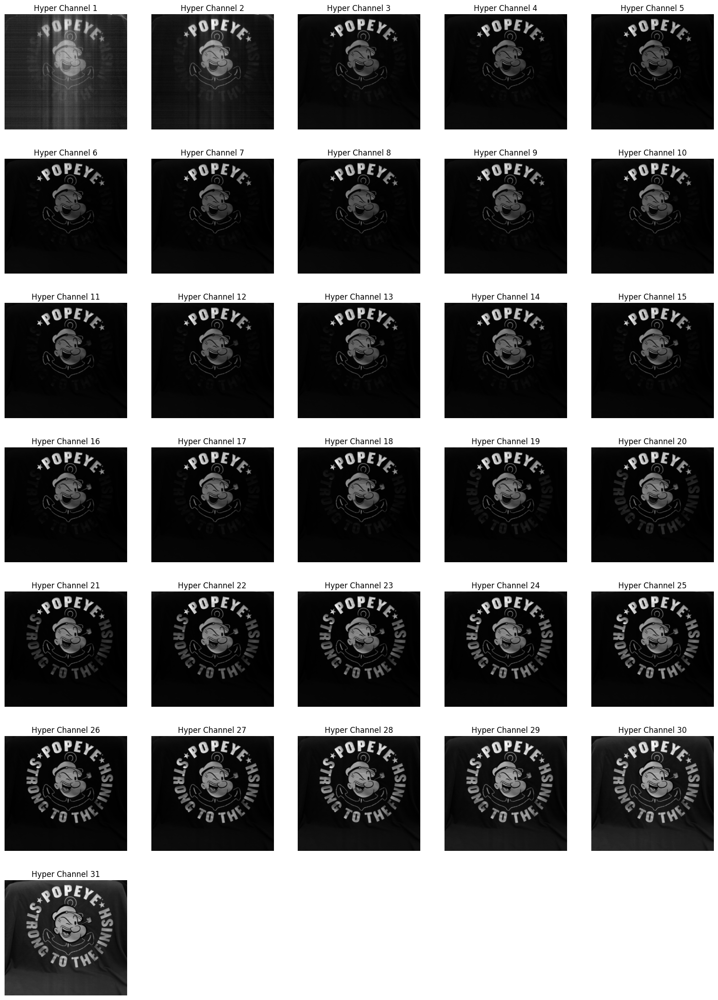

In [42]:

hyper_path = './testing_data/Valid_spectral/ARAD_1K_0929.mat'  # Specify the path to your .mat file
rgb_path = './testing_data/Valid_RGB/ARAD_1K_0929.jpg'  # Specify the path to your RGB image

def visualize_rgb_and_all_hyper_channels(hyper_path, rgb_path):
    # Load hyperspectral image from .mat file
    with h5py.File(hyper_path, 'r') as mat:
        hyper = np.float32(np.array(mat['cube']))
    hyper = np.transpose(hyper, [0, 2, 1])  # Adjust dimensions if necessary

    # Load RGB image
    rgb = cv2.imread(rgb_path)
    rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    rgb = np.float32(rgb)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min())  # Normalize
    rgb = np.transpose(rgb, [2, 0, 1])  # Reorder dimensions for consistency

    # Display the RGB channels
    plt.figure(figsize=(15, 5))
    for i in range(3):  # There are three channels: R, G, B
        plt.subplot(1, 3, i + 1)
        plt.imshow(rgb[i], cmap='gray')
        plt.title(f'RGB Channel {i + 1}')
        plt.axis('off')

    # Display all channels of the hyperspectral image
    num_hyper_channels = hyper.shape[0]  # Total number of spectral channels
    plt.figure(figsize=(20, (num_hyper_channels//5 + 1) * 4))  # Adjust the figure size
    for i in range(num_hyper_channels):
        plt.subplot((num_hyper_channels // 5) + 1, 5, i + 1)  # Arrange subplots
        plt.imshow(hyper[i], cmap='gray')
        plt.title(f'Hyper Channel {i + 1}')
        plt.axis('off')

    plt.show()

# Example usage

visualize_rgb_and_all_hyper_channels(hyper_path, rgb_path)


## predicting

In [50]:
import torch
import torchvision.transforms as transforms
from PIL import Image

# Load your image (replace 'path_to_your_image' with the actual file path)
image = Image.open(rgb_path)
# Define transformations to convert and preprocess the image
preprocess = transforms.Compose([
    transforms.Resize((512, 512)),  # Resize the image to match your model's input size
    transforms.ToTensor(),  # Convert the image to a PyTorch tensor
    transforms.Lambda(lambda x: x[:3, :, :])  # Ensure only the first three channels are used
])

# Apply the transformations to the image
input_data = preprocess(image)

# Add an extra dimension to match the batch size (1 image in this case)
input_data = input_data.unsqueeze(0)

# Assuming 'device' is defined (e.g., device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu"))
# and 'model' is your pre-loaded model
input_data = input_data.to(device)

with torch.no_grad():
    output = model(input_data)

print('input data max:', input_data.max())
print('input data min:', input_data.min())
print('output shape:', output.shape)
print('output max:', output.max())
print('output min:', output.min())


input data max: tensor(1., device='cuda:0')
input data min: tensor(0., device='cuda:0')
output shape: torch.Size([1, 31, 512, 512])
output max: tensor(1., device='cuda:0')
output min: tensor(0., device='cuda:0')


## comparing the predictions with ground truth

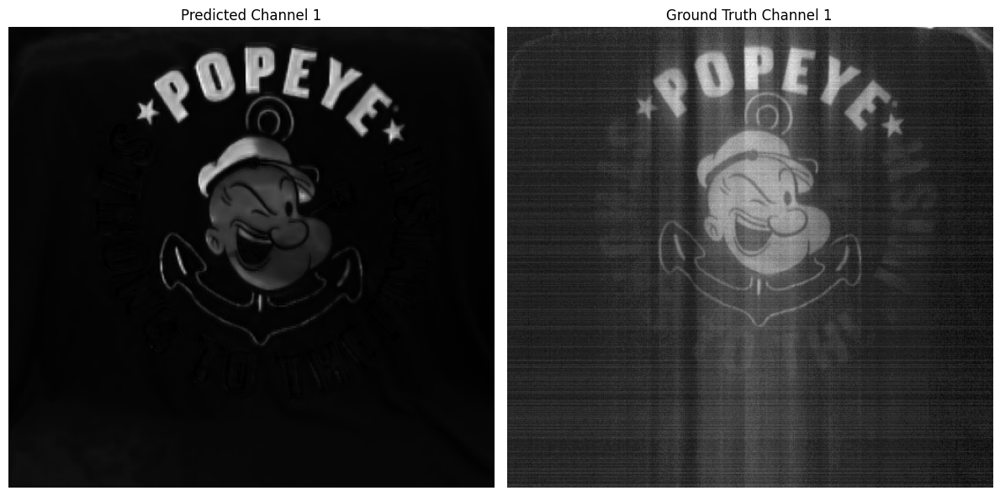

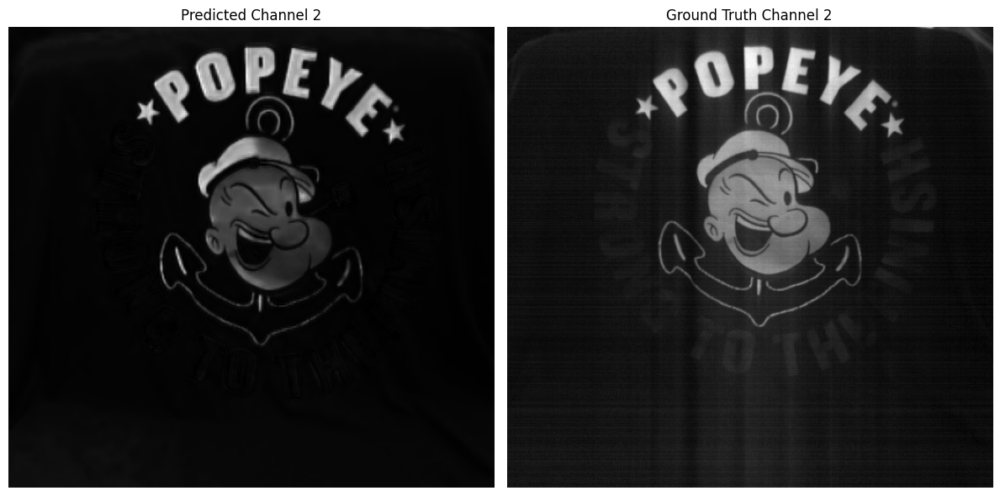

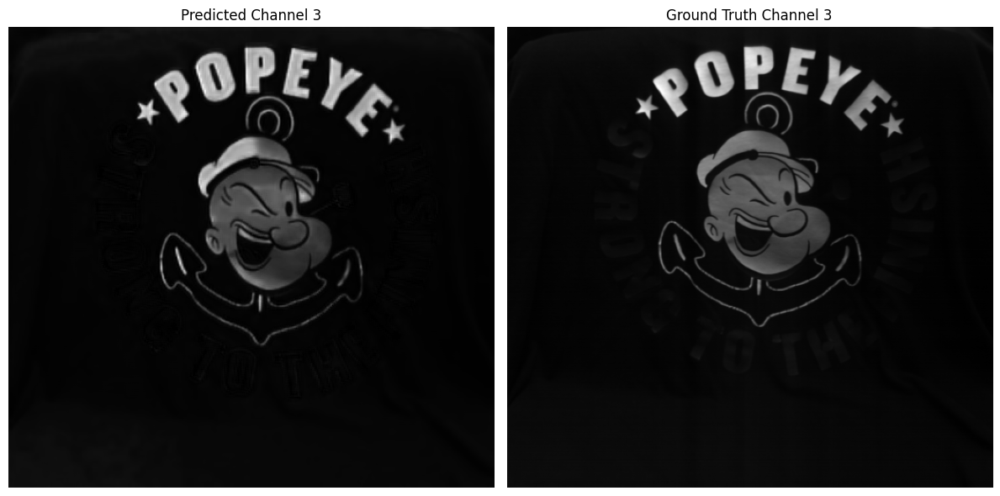

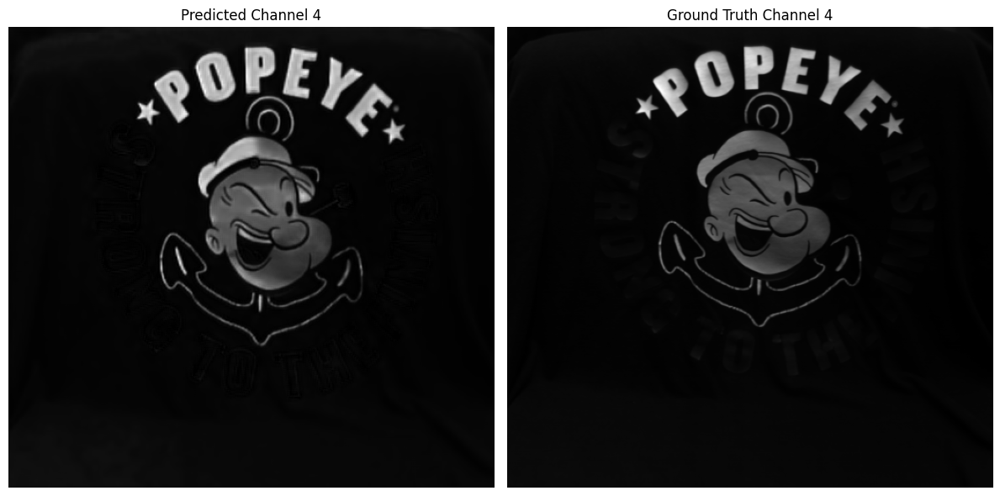

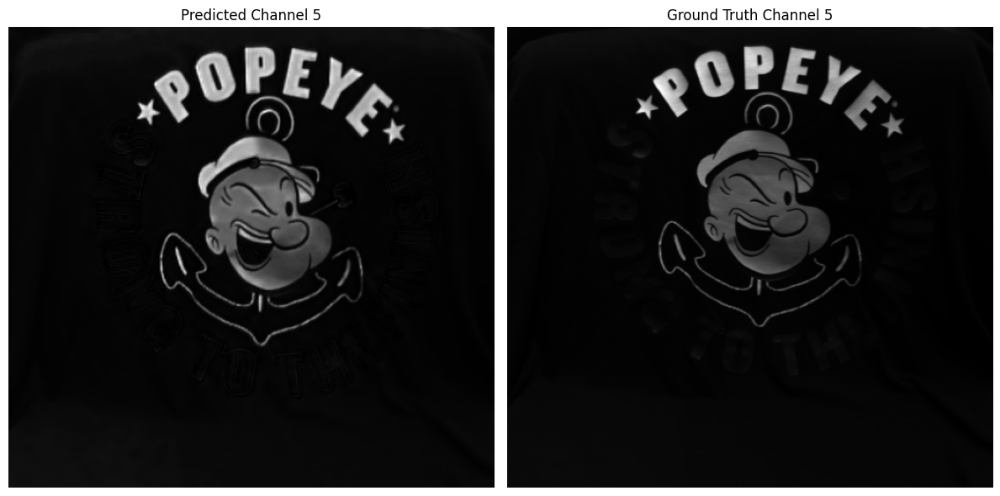

...

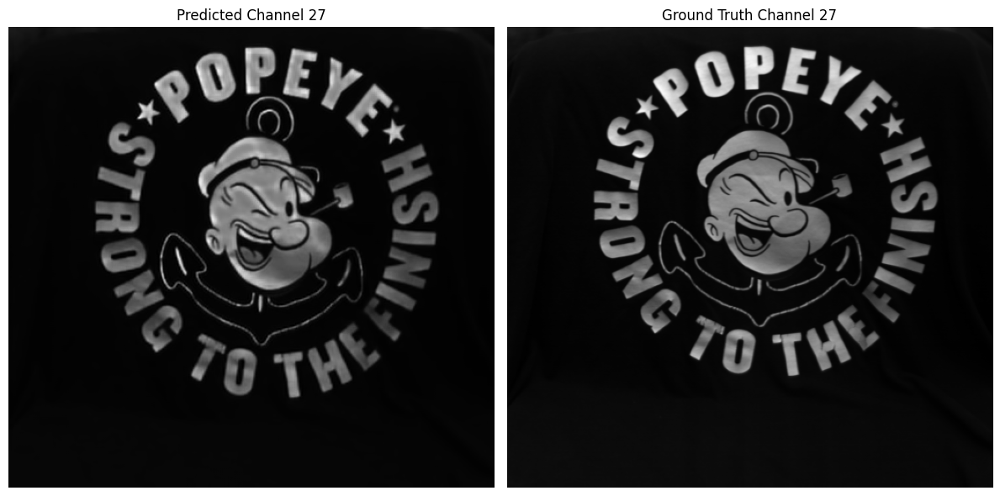

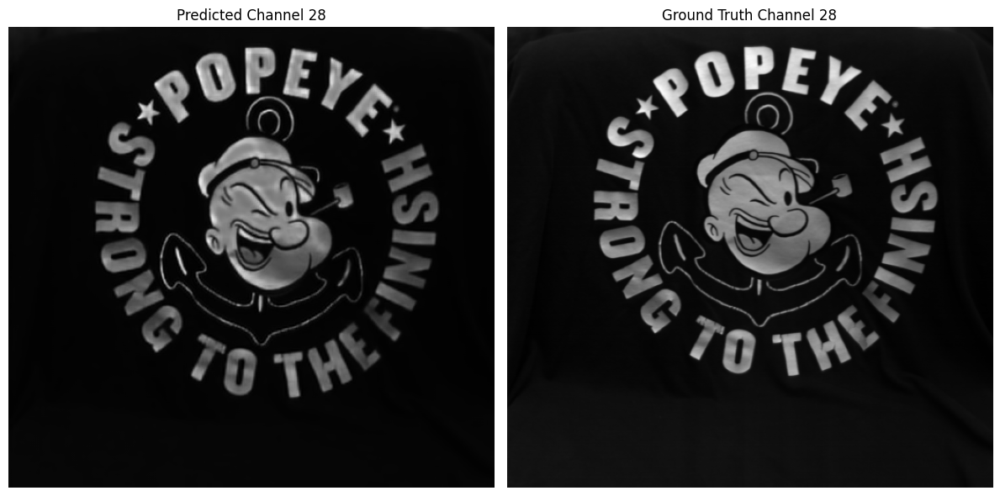

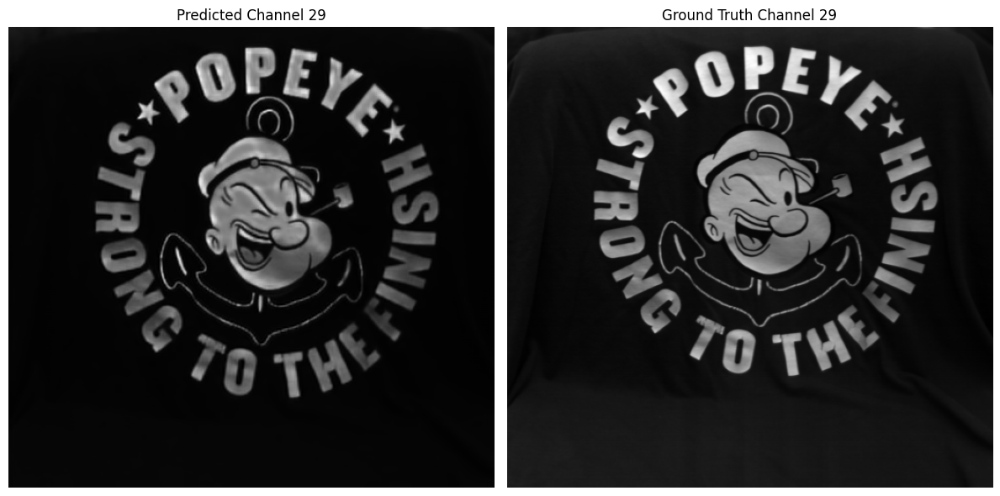

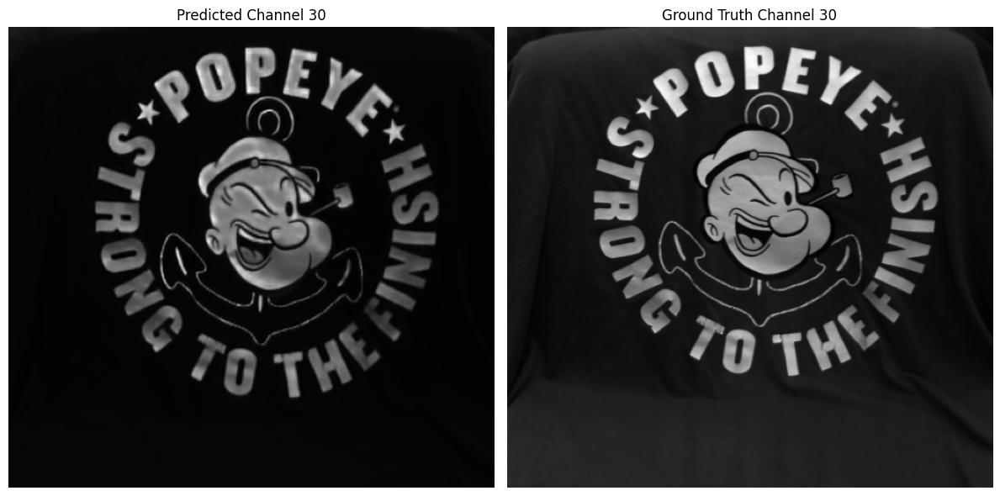

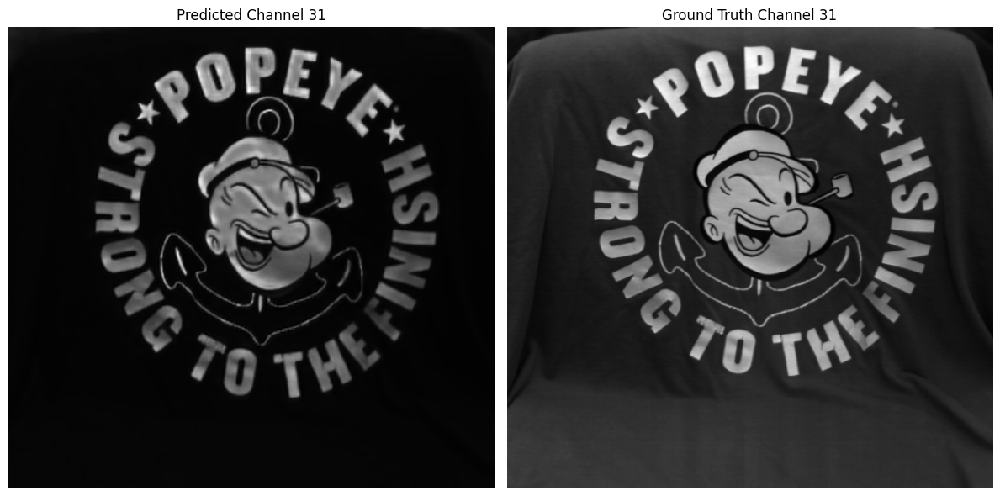

In [54]:
import numpy as np
import cv2
import h5py
import matplotlib.pyplot as plt
import torch

def visualize_output_and_ground_truth(output, hyper_path, num_channels=31):
    # Load hyperspectral data from .mat file
    with h5py.File(hyper_path, 'r') as mat:
        hyper = np.array(mat['cube']).astype(np.float32)
    hyper = np.transpose(hyper, (2, 1, 0))  # Adjust the dimensions to [channels, height, width]

    # Ensure output is a numpy array and move channel to last for visualization
    if isinstance(output, torch.Tensor):
        output = output.detach().cpu().numpy().squeeze()  # Assuming output is [1, C, H, W]
    output = np.transpose(output, (1, 2, 0))  # Change to [H, W, C] if not already

    # Loop through each channel to create individual plots for predicted and ground truth
    for i in range(num_channels):
        plt.figure(figsize=(12, 6))  # Set figure size for each pair of images
        plt.subplots_adjust(wspace=0.05, hspace=0)  # Adjust the spacing between plots

        # Display predicted image
        ax1 = plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
        plt.imshow(output[:, :, i], cmap='gray', aspect='auto')
        plt.title(f'Predicted Channel {i + 1}')
        plt.axis('off')

        # Display ground truth image
        ax2 = plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
        plt.imshow(hyper[:, :, i], cmap='gray', aspect='auto')
        plt.title(f'Ground Truth Channel {i + 1}')
        plt.axis('off')

        # Align axes in case of scaling issues
        ax1.set_xlim(ax2.get_xlim())
        ax1.set_ylim(ax2.get_ylim())

        plt.tight_layout()  # Ensure tight layout to minimize any misalignment
        plt.show()

# Example usage
hyper_path = './testing_data/Valid_spectral/ARAD_1K_0929.mat'  # This should be the path to your .mat file
output = model(input_data)  # Ensure this is defined and calculated correctly

visualize_output_and_ground_truth(output, hyper_path)
